In [1]:
pip install plotly!

Note: you may need to restart the kernel to use updated packages.


ERROR: Invalid requirement: 'plotly!'

[notice] A new release of pip is available: 24.0 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [25]:
import plotly
print(plotly.__version__)

6.0.1


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LinearRegression
from sklearn.decomposition import PCA
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_auc_score, roc_curve, auc

In [3]:
df = pd.read_csv('train.csv')

In [4]:
 df

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41995,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41996,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41997,7,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41998,6,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


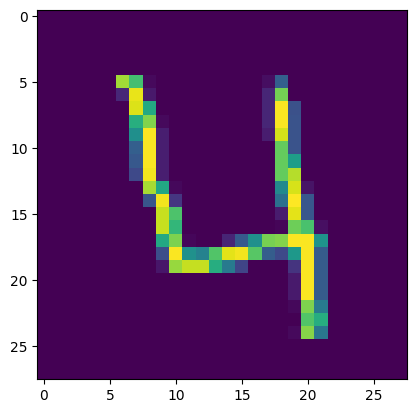

In [5]:
plt.imshow(df.iloc[3,1:].values.reshape(28,28))

In [6]:
X = df.iloc[:,1:]
y = df.iloc[:,0]

In [7]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2, random_state = 42)

In [8]:
knn = KNeighborsClassifier()

In [9]:
knn.fit(X_train,y_train)

KNeighborsClassifier()

In [10]:
import time 
start = time.time()
y_pred = knn.predict(X_test)
print(time.time() - start)

45.81991505622864


In [11]:
accuracy_score(y_test,y_pred)

0.9648809523809524

In [12]:
scaler = StandardScaler()

In [13]:
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [14]:
pca = PCA(n_components=200)

In [15]:
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [16]:
X_train_trf.shape

(33600, 200)

In [17]:
knn = KNeighborsClassifier()

In [18]:
knn.fit(X_train_trf,y_train)

KNeighborsClassifier()

In [19]:
y_pred = knn.predict(X_test_trf)

In [20]:
accuracy_score(y_test,y_pred)

0.9507142857142857

In [21]:
# for 2D visualization
pca = PCA(n_components=2)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [42]:
X_train_trf.shape

(33600, 3)

In [43]:
import plotly.express as px

In [44]:
y_train_trf = y_train.astype(str)
fig = px.scatter(x=X_train_trf[:,0],
                      y= X_train_trf[:,1],
                      color=y_train_trf)
fig.show()

In [53]:
# for 3D visualization
pca = PCA(n_components=3)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [54]:
X_train_trf.shape

(33600, 3)

In [58]:
fig = px.scatter_3d(
    x=X_train_trf[:, 0], 
    y=X_train_trf[:, 1], 
    z=X_train_trf[:, 2], 
    color=y_train_trf.astype(str)
)
fig.show()